In [1]:
train_dir = "C:\\Users\\uSer\\Major__Project\\Clasification_data\\train"
valid_dir = "C:\\Users\\uSer\\Major__Project\\Clasification_data\\valid"
categories = ['fifty','five','fivehundred','hundred','ten','thousand','twenty']

In [2]:
# Counting the number of image in each train and valid directory.
import os
for category in categories:
  print("There are {} {} training images".format(len(os.listdir(os.path.join(train_dir,category))),category))

There are 1500 fifty training images
There are 1500 five training images
There are 1500 fivehundred training images
There are 1500 hundred training images
There are 1500 ten training images
There are 1500 thousand training images
There are 1500 twenty training images


In [3]:
for category in categories:
  print("There are {} {} training images".format(len(os.listdir(os.path.join(valid_dir,category))),category))

There are 500 fifty training images
There are 500 five training images
There are 500 fivehundred training images
There are 500 hundred training images
There are 500 ten training images
There are 500 thousand training images
There are 500 twenty training images


In [4]:
# Getting 5 images of each from seven classes
def extract_images(data_dir,no):
  img_paths = []
  for category in categories:
    i = 0
    path = os.path.join(data_dir,category)
    for img in os.listdir(path):
      i+= 1
      if i > no:
        break
      img_paths.append(os.path.join(path,img))
  return img_paths

In [5]:
training_image_paths = extract_images(train_dir,5)
print(training_image_paths)
print(len(training_image_paths))

['C:\\Users\\uSer\\Major__Project\\Clasification_data\\train\\fifty\\Rs (1).jpg', 'C:\\Users\\uSer\\Major__Project\\Clasification_data\\train\\fifty\\Rs (100).jpg', 'C:\\Users\\uSer\\Major__Project\\Clasification_data\\train\\fifty\\Rs (1000).jpg', 'C:\\Users\\uSer\\Major__Project\\Clasification_data\\train\\fifty\\Rs (1001).jpg', 'C:\\Users\\uSer\\Major__Project\\Clasification_data\\train\\fifty\\Rs (1002).jpg', 'C:\\Users\\uSer\\Major__Project\\Clasification_data\\train\\five\\CamScanner 12-22-2023 13.26_1.jpg', 'C:\\Users\\uSer\\Major__Project\\Clasification_data\\train\\five\\five_train_1.jpg', 'C:\\Users\\uSer\\Major__Project\\Clasification_data\\train\\five\\five_train_10.jpg', 'C:\\Users\\uSer\\Major__Project\\Clasification_data\\train\\five\\five_train_100.jpg', 'C:\\Users\\uSer\\Major__Project\\Clasification_data\\train\\five\\five_train_101.jpg', 'C:\\Users\\uSer\\Major__Project\\Clasification_data\\train\\fivehundred\\Rs (1).jpg', 'C:\\Users\\uSer\\Major__Project\\Clasificat

In [6]:
validation_image_paths = extract_images(valid_dir,5)
print(validation_image_paths)
print(len(validation_image_paths))

['C:\\Users\\uSer\\Major__Project\\Clasification_data\\valid\\fifty\\fifty_valid_100.jpg', 'C:\\Users\\uSer\\Major__Project\\Clasification_data\\valid\\fifty\\fifty_valid_101.jpg', 'C:\\Users\\uSer\\Major__Project\\Clasification_data\\valid\\fifty\\fifty_valid_102.jpg', 'C:\\Users\\uSer\\Major__Project\\Clasification_data\\valid\\fifty\\fifty_valid_103.jpg', 'C:\\Users\\uSer\\Major__Project\\Clasification_data\\valid\\fifty\\fifty_valid_104.jpg', 'C:\\Users\\uSer\\Major__Project\\Clasification_data\\valid\\five\\five_valid_10.jpg', 'C:\\Users\\uSer\\Major__Project\\Clasification_data\\valid\\five\\five_valid_100.jpg', 'C:\\Users\\uSer\\Major__Project\\Clasification_data\\valid\\five\\five_valid_101.jpg', 'C:\\Users\\uSer\\Major__Project\\Clasification_data\\valid\\five\\five_valid_102.jpg', 'C:\\Users\\uSer\\Major__Project\\Clasification_data\\valid\\five\\five_valid_103.jpg', 'C:\\Users\\uSer\\Major__Project\\Clasification_data\\valid\\fivehundred\\fivehun_valid_10.jpg', 'C:\\Users\\u

In [7]:
# Visualizing the training and validation images
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
def visualize_images(images_path,rows,cols):
  fig = plt.figure(figsize=(20,20))
  rows = rows
  cols = cols
  for i in range(1,rows*cols+1):
    fig.add_subplot(rows,cols,i)
    img_array = mpimg.imread(images_path[i-1])
    plt.imshow(img_array)
  plt.show()

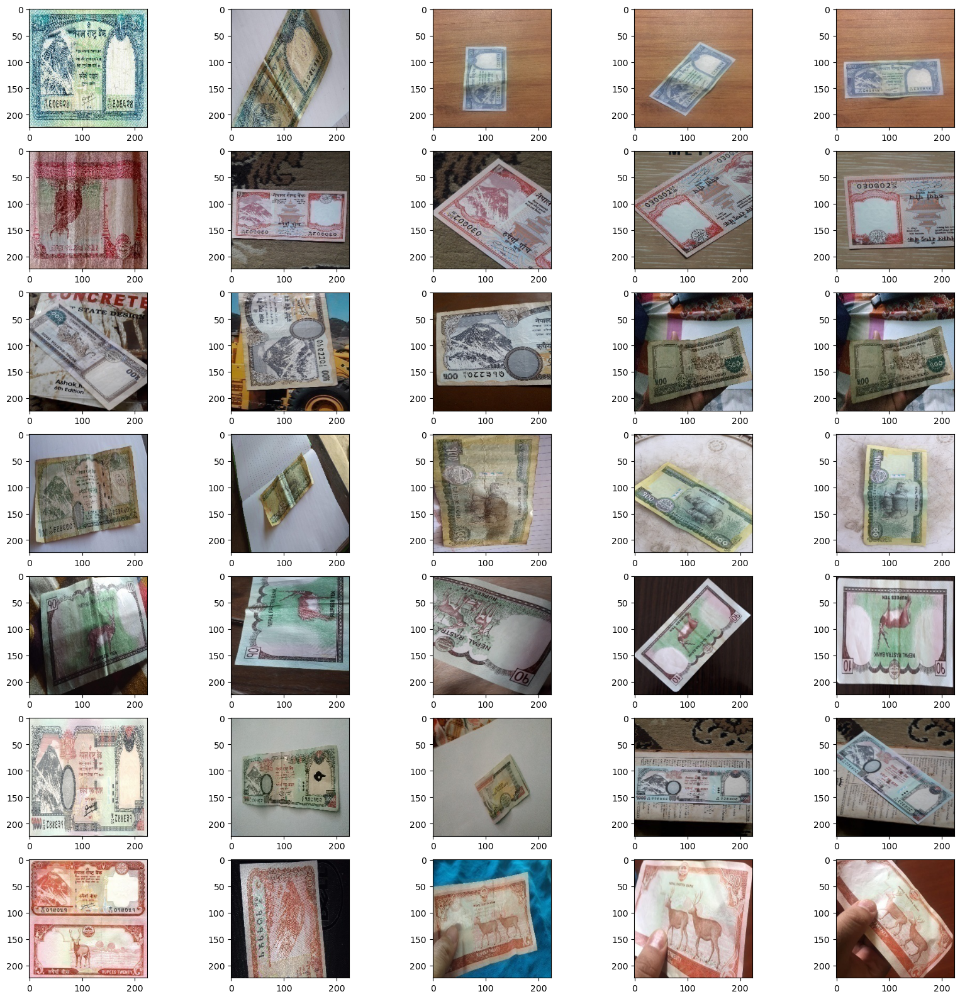

In [8]:
# Visualizing Training Images
visualize_images(training_image_paths,7,5)

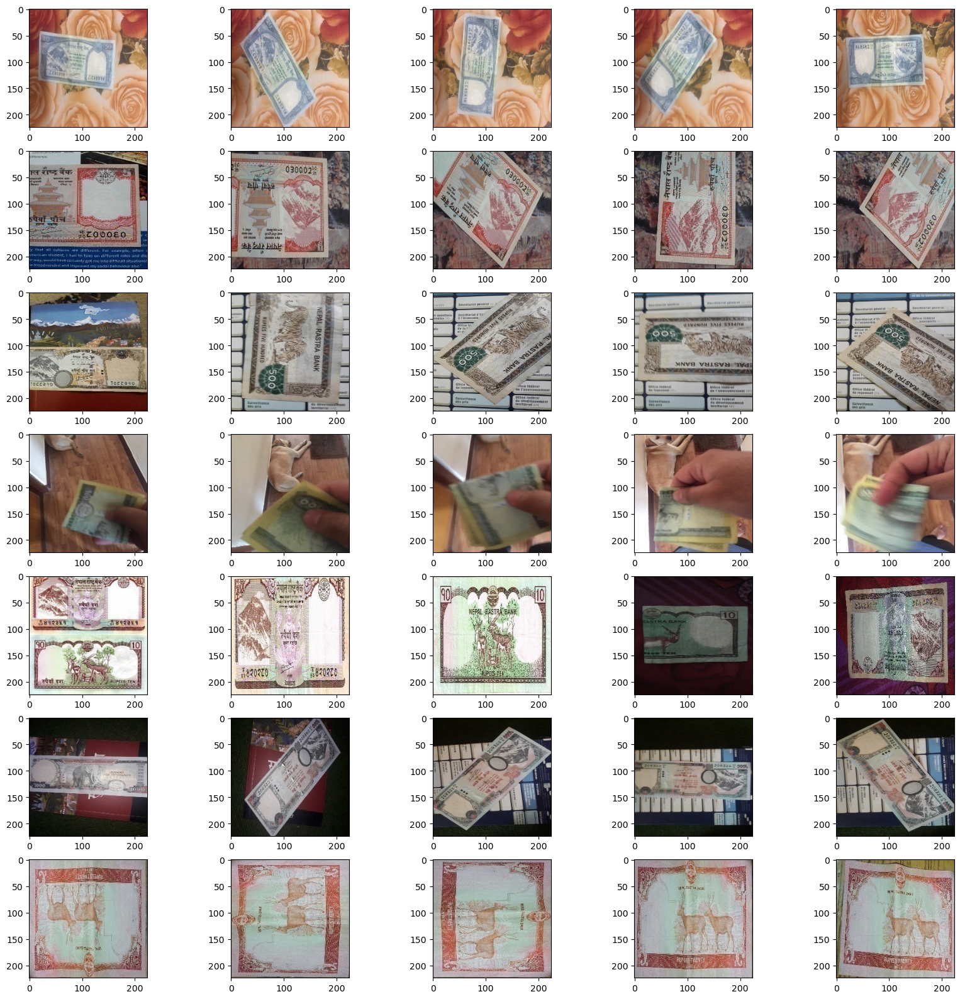

In [9]:
# Visualizing the validation images
visualize_images(validation_image_paths,7,5)

In [10]:
import cv2
def change_shape(data_dir):
  for category in categories:
    path = os.path.join(data_dir,category)
    for img in os.listdir(path):
      img_array = cv2.imread(os.path.join(os.path.join(path,img)))
      resized_img_array = cv2.resize(img_array,(224,224))
      cv2.imwrite(os.path.join(path,img),resized_img_array)

In [11]:
change_shape(data_dir= train_dir)

In [12]:
change_shape(data_dir = valid_dir)

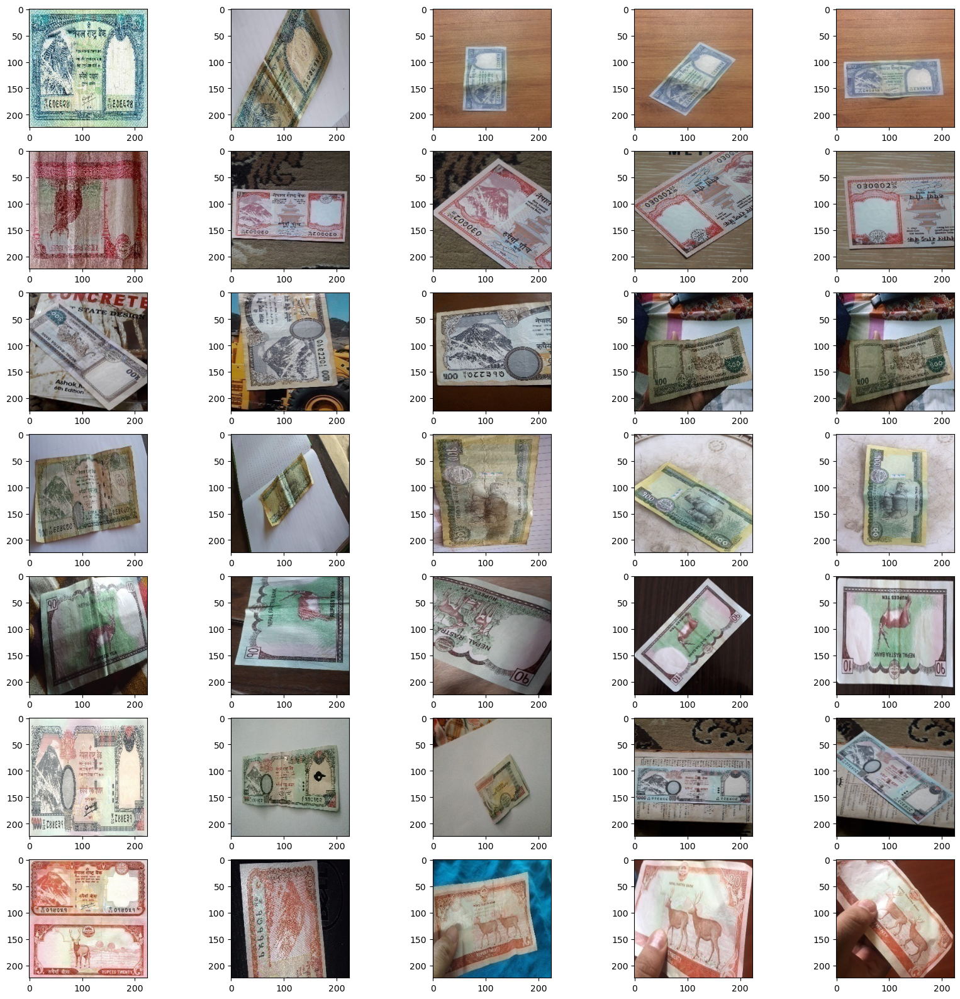

In [13]:
visualize_images(training_image_paths,7,5)

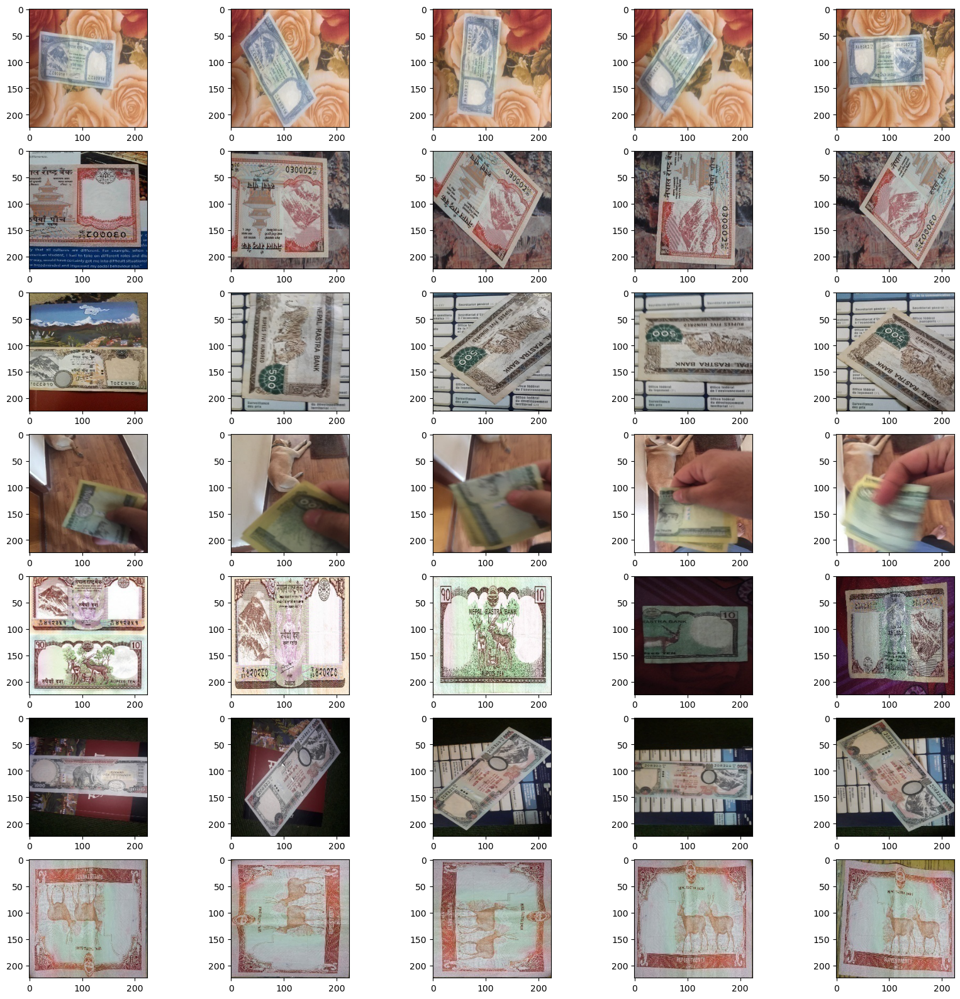

In [14]:
visualize_images(validation_image_paths,7,5)

In [15]:
def get_shapes(data_dir):
  dict = {}
  for category in categories:
    path = os.path.join(data_dir,category)
    for img in os.listdir(path):
      img_array = cv2.imread(os.path.join(path,img))
      shapes = img_array.shape
      if shapes not in dict:
        dict[shapes] = 1
      else:
        dict[shapes] += 1
  return dict


In [16]:
get_shapes(data_dir=valid_dir)

{(224, 224, 3): 3500}

In [17]:
get_shapes(data_dir=train_dir)

{(224, 224, 3): 10500}

In [18]:
# Loading the Data Generators

In [19]:

from keras.preprocessing.image import ImageDataGenerator


train_datagen = ImageDataGenerator(rescale=1./ 255)
valid_datagen = ImageDataGenerator(rescale=1./ 255)

In [20]:
train_generator = train_datagen.flow_from_directory("C:\\Users\\uSer\\Major__Project\\Clasification_data\\train",target_size=(224,224),batch_size=32,class_mode='categorical')
valid_generator = valid_datagen.flow_from_directory("C:\\Users\\uSer\\Major__Project\\Clasification_data\\valid",target_size=(224,224),batch_size=32,class_mode='categorical')

Found 10500 images belonging to 7 classes.
Found 3500 images belonging to 7 classes.


In [21]:
# Data Augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

In [22]:
# Building the model

from keras.applications.inception_v3 import InceptionV3
from keras.models import Model
from keras.layers import Flatten,Dense,Dropout
from keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau,ModelCheckpoint,EarlyStopping

In [23]:
img_height = 224
img_width = 224
inception = InceptionV3(weights='imagenet',include_top=False,input_shape=(img_height,img_width,3))

In [24]:
inception.trainable = True

In [25]:
# Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ", len(inception.layers))

# Fine-tune from this layer onwards
fine_tune_at = 75

# Freeze all the layers before the `fine_tune_at` layer
for layer in inception.layers[:fine_tune_at]:
  layer.trainable =  False

Number of layers in the base model:  311


In [26]:
print(inception.output)

KerasTensor(type_spec=TensorSpec(shape=(None, 5, 5, 2048), dtype=tf.float32, name=None), name='mixed10/concat:0', description="created by layer 'mixed10'")


In [27]:
from keras.layers import Flatten, Dropout, Dense

output = Flatten()(inception.output)
output = Dropout(0.5)(output)
prediction = Dense(7, activation='softmax')(output)


In [28]:
model = Model(inputs = inception.input,outputs = prediction)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 111, 111, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 111, 111, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 111, 111, 32)         0         ['batch_normalization[0][0

 conv2d_11 (Conv2D)          (None, 25, 25, 32)           6144      ['average_pooling2d[0][0]']   
                                                                                                  
 batch_normalization_5 (Bat  (None, 25, 25, 64)           192       ['conv2d_5[0][0]']            
 chNormalization)                                                                                 
                                                                                                  
 batch_normalization_7 (Bat  (None, 25, 25, 64)           192       ['conv2d_7[0][0]']            
 chNormalization)                                                                                 
                                                                                                  
 batch_normalization_10 (Ba  (None, 25, 25, 96)           288       ['conv2d_10[0][0]']           
 tchNormalization)                                                                                
          

                                                                                                  
 activation_17 (Activation)  (None, 25, 25, 96)           0         ['batch_normalization_17[0][0]
                                                                    ']                            
                                                                                                  
 activation_18 (Activation)  (None, 25, 25, 64)           0         ['batch_normalization_18[0][0]
                                                                    ']                            
                                                                                                  
 mixed1 (Concatenate)        (None, 25, 25, 288)          0         ['activation_12[0][0]',       
                                                                     'activation_14[0][0]',       
                                                                     'activation_17[0][0]',       
          

                                                                                                  
 conv2d_28 (Conv2D)          (None, 25, 25, 96)           55296     ['activation_27[0][0]']       
                                                                                                  
 batch_normalization_28 (Ba  (None, 25, 25, 96)           288       ['conv2d_28[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_28 (Activation)  (None, 25, 25, 96)           0         ['batch_normalization_28[0][0]
                                                                    ']                            
                                                                                                  
 conv2d_26 (Conv2D)          (None, 12, 12, 384)          995328    ['mixed2[0][0]']              
          

 conv2d_30 (Conv2D)          (None, 12, 12, 192)          147456    ['mixed3[0][0]']              
                                                                                                  
 conv2d_33 (Conv2D)          (None, 12, 12, 192)          172032    ['activation_32[0][0]']       
                                                                                                  
 conv2d_38 (Conv2D)          (None, 12, 12, 192)          172032    ['activation_37[0][0]']       
                                                                                                  
 conv2d_39 (Conv2D)          (None, 12, 12, 192)          147456    ['average_pooling2d_3[0][0]'] 
                                                                                                  
 batch_normalization_30 (Ba  (None, 12, 12, 192)          576       ['conv2d_30[0][0]']           
 tchNormalization)                                                                                
          

                                                                    ']                            
                                                                                                  
 average_pooling2d_4 (Avera  (None, 12, 12, 768)          0         ['mixed4[0][0]']              
 gePooling2D)                                                                                     
                                                                                                  
 conv2d_40 (Conv2D)          (None, 12, 12, 192)          147456    ['mixed4[0][0]']              
                                                                                                  
 conv2d_43 (Conv2D)          (None, 12, 12, 192)          215040    ['activation_42[0][0]']       
                                                                                                  
 conv2d_48 (Conv2D)          (None, 12, 12, 192)          215040    ['activation_47[0][0]']       
          

                                                                                                  
 activation_52 (Activation)  (None, 12, 12, 160)          0         ['batch_normalization_52[0][0]
                                                                    ']                            
                                                                                                  
 activation_57 (Activation)  (None, 12, 12, 160)          0         ['batch_normalization_57[0][0]
                                                                    ']                            
                                                                                                  
 average_pooling2d_5 (Avera  (None, 12, 12, 768)          0         ['mixed5[0][0]']              
 gePooling2D)                                                                                     
                                                                                                  
 conv2d_50

 batch_normalization_62 (Ba  (None, 12, 12, 192)          576       ['conv2d_62[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 batch_normalization_67 (Ba  (None, 12, 12, 192)          576       ['conv2d_67[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_62 (Activation)  (None, 12, 12, 192)          0         ['batch_normalization_62[0][0]
                                                                    ']                            
                                                                                                  
 activation_67 (Activation)  (None, 12, 12, 192)          0         ['batch_normalization_67[0][0]
          

                                                                                                  
 conv2d_71 (Conv2D)          (None, 5, 5, 320)            552960    ['activation_70[0][0]']       
                                                                                                  
 conv2d_75 (Conv2D)          (None, 5, 5, 192)            331776    ['activation_74[0][0]']       
                                                                                                  
 batch_normalization_71 (Ba  (None, 5, 5, 320)            960       ['conv2d_71[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 batch_normalization_75 (Ba  (None, 5, 5, 192)            576       ['conv2d_75[0][0]']           
 tchNormalization)                                                                                
          

                                                                                                  
 activation_82 (Activation)  (None, 5, 5, 384)            0         ['batch_normalization_82[0][0]
                                                                    ']                            
                                                                                                  
 activation_83 (Activation)  (None, 5, 5, 384)            0         ['batch_normalization_83[0][0]
                                                                    ']                            
                                                                                                  
 batch_normalization_84 (Ba  (None, 5, 5, 192)            576       ['conv2d_84[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activatio

                                                                                                  
 activation_88 (Activation)  (None, 5, 5, 384)            0         ['batch_normalization_88[0][0]
                                                                    ']                            
                                                                                                  
 activation_91 (Activation)  (None, 5, 5, 384)            0         ['batch_normalization_91[0][0]
                                                                    ']                            
                                                                                                  
 activation_92 (Activation)  (None, 5, 5, 384)            0         ['batch_normalization_92[0][0]
                                                                    ']                            
                                                                                                  
 batch_nor

In [29]:
import os
os.mkdir("C:\\Users\\uSer\\Desktop\\Major-Projects\\Detection\\modell_weightss")

FileExistsError: [WinError 183] Cannot create a file when that file already exists: 'C:\\Users\\uSer\\Desktop\\Major-Projects\\Detection\\modell_weightss'

In [30]:
from keras.optimizers import RMSprop

model.compile(
  loss='categorical_crossentropy',
  optimizer=RMSprop(
    learning_rate=0.00001,
    rho=0.9,  # RMSprop parameter corresponding to beta_1 in Adam
    epsilon=1e-07,
),
  metrics=['accuracy']
)


In [31]:
early_stopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)

In [32]:
model_checkpoint = ModelCheckpoint("C:\\Users\\uSer\\Desktop\\Major-Projects\\Detection\\modell_weightss\\nepalese_currency_recognition_model_{epoch:02d}-{val_loss:.6f}.h5", monitor='val_loss', mode='min', verbose=1, save_best_only=True,save_weights_only=True)
# checkpointer = ModelCheckpoint(filepath = 'model_zero7.{epoch:02d}-{val_loss:.6f}.hdf5',
#                                verbose=1,
#                                save_best_only=True, save_weights_only = True)

In [33]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=5, min_lr=0.0000001, verbose=1,cooldown=0)

In [34]:
history = model.fit_generator(train_generator,steps_per_epoch = len(train_generator) //25,epochs = 40,validation_data = valid_generator,validation_steps = len(valid_generator) //25,callbacks=[model_checkpoint,reduce_lr,early_stopping])

C:\Users\uSer\AppData\Local\Temp\ipykernel_6840\1920434198.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_generator,steps_per_epoch = len(train_generator) //25,epochs = 40,validation_data = valid_generator,validation_steps = len(valid_generator) //25,callbacks=[model_checkpoint,reduce_lr,early_stopping])


Epoch 1/40


13/13 [==============================] - ETA: 0s - loss: 2.4441 - accuracy: 0.1827
Epoch 1: val_loss improved from inf to 2.41670, saving model to C:\Users\uSer\Desktop\Major-Projects\Detection\modell_weightss\nepalese_currency_recognition_model_01-2.416695.h5
13/13 [==============================] - 52s 3s/step - loss: 2.4441 - accuracy: 0.1827 - val_loss: 2.4167 - val_accuracy: 0.1953 - lr: 1.0000e-05
Epoch 2/40
13/13 [==============================] - ETA: 0s - loss: 2.1836 - accuracy: 0.2163
Epoch 2: val_loss improved from 2.41670 to 2.34268, saving model to C:\Users\uSer\Desktop\Major-Projects\Detection\modell_weightss\nepalese_currency_recognition_model_02-2.342679.h5
13/13 [==============================] - 40s 3s/step - loss: 2.1836 - accuracy: 0.2163 - val_loss: 2.3427 - val_accuracy: 0.2344 - lr: 1.0000e-05
Epoch 3/40
13/13 [==============================] - ETA: 0s - loss: 1.9364 - accuracy: 0.2933
Epoch 3: val_loss improved from 2.34268 to 2.26445, saving model

13/13 [==============================] - ETA: 0s - loss: 0.5549 - accuracy: 0.8221
Epoch 21: val_loss improved from 0.87803 to 0.84653, saving model to C:\Users\uSer\Desktop\Major-Projects\Detection\modell_weightss\nepalese_currency_recognition_model_21-0.846528.h5
13/13 [==============================] - 40s 3s/step - loss: 0.5549 - accuracy: 0.8221 - val_loss: 0.8465 - val_accuracy: 0.6875 - lr: 1.0000e-05
Epoch 22/40
13/13 [==============================] - ETA: 0s - loss: 0.4885 - accuracy: 0.8486
Epoch 22: val_loss did not improve from 0.84653
13/13 [==============================] - 40s 3s/step - loss: 0.4885 - accuracy: 0.8486 - val_loss: 0.9102 - val_accuracy: 0.7031 - lr: 1.0000e-05
Epoch 23/40
13/13 [==============================] - ETA: 0s - loss: 0.5489 - accuracy: 0.8053
Epoch 23: val_loss did not improve from 0.84653
13/13 [==============================] - 40s 3s/step - loss: 0.5489 - accuracy: 0.8053 - val_loss: 0.8771 - val_accuracy: 0.7500 - lr: 1.0000e-05
Epoch 24/4

In [35]:
# Evaluate the model on the full test set
test_loss, test_accuracy = model.evaluate(valid_generator)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)


110/110 [==============================] - 128s 1s/step - loss: 0.5652 - accuracy: 0.8117
Test Loss: 0.5652426481246948
Test Accuracy: 0.8117142915725708


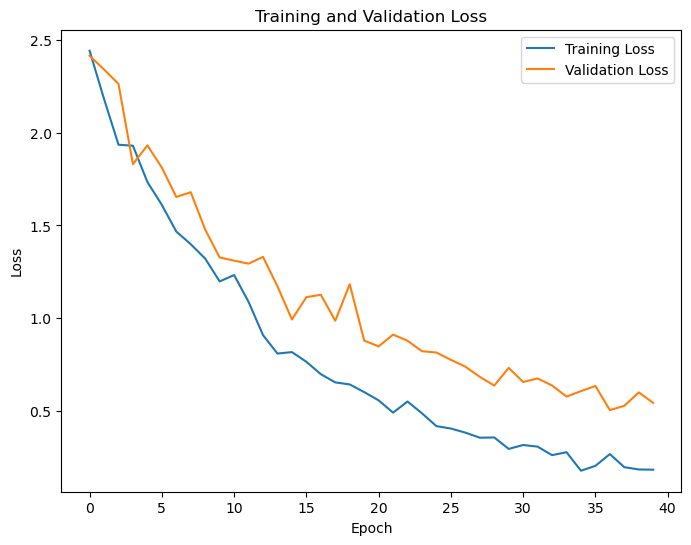

In [36]:

import matplotlib.pyplot as plt



# Get the training and validation metrics from the history object
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Plot the training and validation loss
plt.figure(figsize=(8, 6))
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()


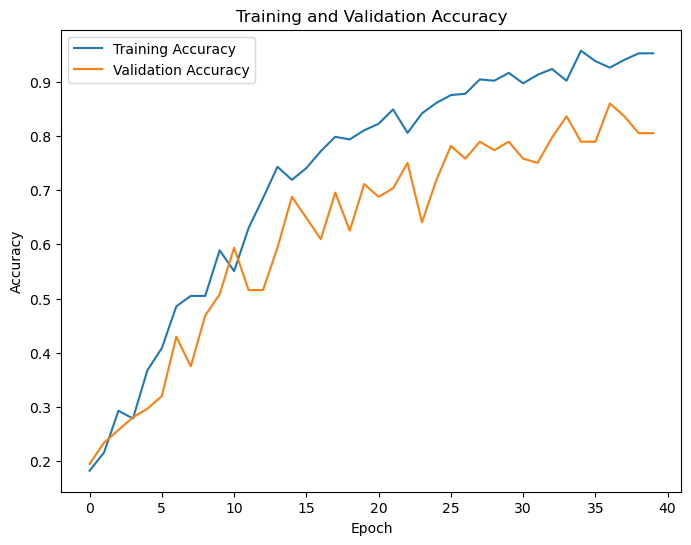

In [37]:

# Plot the training and validation accuracy
plt.figure(figsize=(8, 6))
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

In [38]:
# serialize model to JSON
model_json = model.to_json()
with open("nepalese_currency_recognition_modelrms.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model.save_weights("nepalese_currency_recognition_modelrms.h5")
print("Saved model to disk")


Saved model to disk


In [39]:
# Load model and make predictions
from keras.models import model_from_json

1/1 [==============================] - 0s 499ms/step
Confusion matrix, without normalization
Normalized confusion matrix


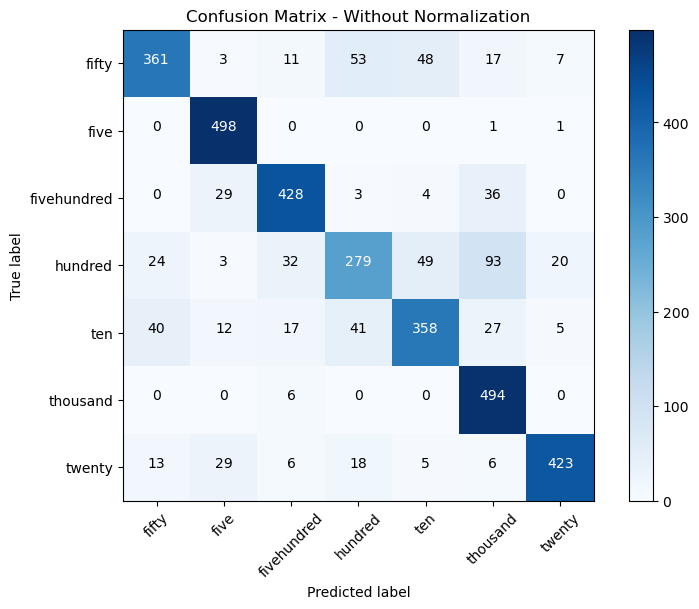

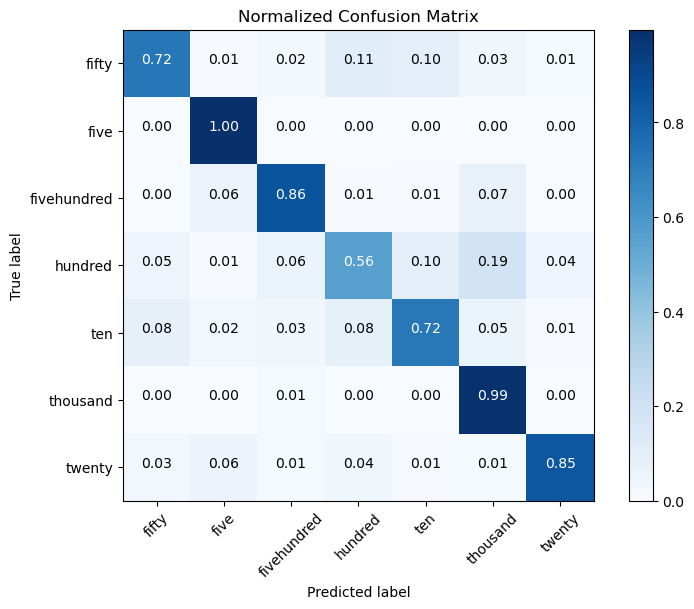

In [42]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.utils.multiclass import unique_labels
import itertools
import numpy as np

# Get true labels and predicted labels for the validation set
true_labels = []
predicted_labels = []

for i in range(len(valid_generator)):
    x_batch, y_batch = valid_generator[i]
    true_labels.extend(np.argmax(y_batch, axis=1))
    predicted_labels.extend(np.argmax(model.predict(x_batch), axis=1))

# Create confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion Matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# Plot non-normalized confusion matrix
plt.figure(figsize=(8, 6))
plot_confusion_matrix(cm, classes=Currencies, title='Confusion Matrix - Without Normalization')

# Plot normalized confusion matrix
plt.figure(figsize=(8, 6))
plot_confusion_matrix(cm, classes=Currencies, normalize=True, title='Normalized Confusion Matrix')

plt.show()


In [43]:

# Evaluate the model on the full training set
train_loss, train_accuracy = model.evaluate(train_generator)
print("Train Loss:", train_loss)
print("Train Accuracy:", train_accuracy)


329/329 [==============================] - 536s 2s/step - loss: 0.0926 - accuracy: 0.9766
Train Loss: 0.09263815730810165
Train Accuracy: 0.9765714406967163


In [41]:
Currencies = ['fifty','five','fivehundred','hundred','ten','thousand','twenty']

In [44]:
from keras.preprocessing import image

In [45]:
def check_currency(path,currency):
  predictor = {}
  path= os.path.join(path,currency)
  for img in os.listdir(path):
    img = image.load_img(os.path.join(path,img),target_size=(480,480))
    img = image.img_to_array(img)
    img = np.expand_dims(img,axis=0)
    img = img / 255.0
    prediction = loaded_model.predict(img)
    prediction_class  = np.argmax(prediction)
    result = Currencies[prediction_class]
    if result not in predictor:
      predictor[result] = 1
    else:
      predictor[result] += 1
  return predictor



In [46]:
 # load json and create model
json_file = open("C:\\Users\\uSer\\Desktop\\Major-Projects\\Detection\\nepalese_currency_recognition_modelrms.json", 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights("C:\\Users\\uSer\\Desktop\\Major-Projects\\Detection\\model_weights\\nepalese_currency_recognition_modelrms.h5")
print("Loaded model from disk")


FileNotFoundError: [Errno 2] Unable to open file (unable to open file: name = 'C:\Users\uSer\Desktop\Major-Projects\Detection\model_weights\nepalese_currency_recognition_modelrms.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)